Download Dataset

In [1]:
import os
import kagglehub

file_path = os.path.join(os.getcwd(), "datasets")
print("Dataset directory:", file_path)

if not os.path.exists(file_path) or not os.listdir(file_path):
    path = kagglehub.dataset_download("andrewmvd/lung-and-colon-cancer-histopathological-images")
    print("Downloaded dataset to:", path)
else:
    print("Dataset already exists at:", file_path)
    print("Contents:", os.listdir(file_path))

Dataset directory: /app/datasets
Dataset already exists at: /app/datasets
Contents: ['lung_colon_flat', 'andrewmvd', '.DS_Store']


Import required libraries

In [2]:
import tensorflow as tf
import keras
import keras_tuner as kt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import random
import shutil
import tensorflow as tf

MV required dataset to the main_directory

In [3]:
lung_colon = os.path.join(
    file_path,
    "andrewmvd",
    "lung-and-colon-cancer-histopathological-images",
    "versions",
    "1",
    "lung_colon_image_set"
)

print(os.listdir(lung_colon))

['colon_image_sets', 'lung_image_sets']


In [7]:
# ds = tf.keras.utils.image_dataset_from_directory(
#     lung_colon,
#     labels='inferred',
#     label_mode='categorical', 
#     image_size=(224, 224),
#     batch_size=32
# )

# print("Detected class folders:", ds.class_names)
# print("Number of class folders:", len(ds.class_names))

Now map folders for their name

In [4]:
top_level_dirs = [d for d in os.listdir(lung_colon) if os.path.isdir(os.path.join(lung_colon, d))]
print("Top-level directories:", top_level_dirs)

# Now, list directories inside 'colon_image_sets'
colon_image_sets_path = os.path.join(lung_colon, "colon_image_sets")
colon_subdirs = [d for d in os.listdir(colon_image_sets_path) if os.path.isdir(os.path.join(colon_image_sets_path, d))]
print("Subdirectories in colon_image_sets:", colon_subdirs)


lung_image_sets = os.path.join(lung_colon, "lung_image_sets")
lung_subdirs = [d for d in os.listdir(lung_image_sets) if os.path.isdir(os.path.join(lung_image_sets, d))]
print("Subdirectories in lung_image_sets:", lung_subdirs)

classess = [lung_subdirs, colon_subdirs]
print("Classess:", classess)
class_labels = {
    "lung_aca": "Lung Adenocarcinoma",
    "lung_n": "Lung Benign Tissue (Normal)",
    "lung_scc": "Lung Squamous Cell Carcinoma",
    "colon_aca": "Colon Adenocarcinoma",
    "colon_n": "Colon Benign Tissue (Normal)"
}
print("Class labels:", class_labels)

Top-level directories: ['colon_image_sets', 'lung_image_sets']
Subdirectories in colon_image_sets: []
Subdirectories in lung_image_sets: []
Classess: [[], []]
Class labels: {'lung_aca': 'Lung Adenocarcinoma', 'lung_n': 'Lung Benign Tissue (Normal)', 'lung_scc': 'Lung Squamous Cell Carcinoma', 'colon_aca': 'Colon Adenocarcinoma', 'colon_n': 'Colon Benign Tissue (Normal)'}


In [5]:
import os
import shutil

flat_dir = "/app/datasets/lung_colon_flat"
os.makedirs(flat_dir, exist_ok=True)

for top in os.listdir(lung_colon):
    top_path = os.path.join(lung_colon, top)
    if os.path.isdir(top_path):
        for class_dir in os.listdir(top_path):
            class_path = os.path.join(top_path, class_dir)
            dest_path = os.path.join(flat_dir, class_dir)
            # Only move if it's a directory and not already moved
            if os.path.isdir(class_path) and not os.path.exists(dest_path):
                shutil.move(class_path, dest_path)

print("Flattened class folders:", os.listdir(flat_dir))


Flattened class folders: ['.DS_Store', 'lung_n', 'colon_aca', 'augmentation.gif', 'lung_scc', 'colon_n', 'lung_aca']


Prepared Datasets for training

In [6]:
import tensorflow as tf

BATCH_SIZE = 32
IMG_SIZE = (224, 224)

flat_dir = "/app/datasets/lung_colon_flat"

train_ds = tf.keras.utils.image_dataset_from_directory(
    flat_dir,
    labels='inferred',
    label_mode='categorical',   # for one-hot encoded labels
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    validation_split=0.2,
    subset="training",
    seed=123
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    flat_dir,
    labels='inferred',
    label_mode='categorical',
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    validation_split=0.2,
    subset="validation",
    seed=123
)

class_names = train_ds.class_names
print("Class names:", class_names)


Found 25016 files belonging to 5 classes.
Using 20013 files for training.
Found 25016 files belonging to 5 classes.
Using 5003 files for validation.
Class names: ['colon_aca', 'colon_n', 'lung_aca', 'lung_n', 'lung_scc']


In [12]:
for class_name in os.listdir(flat_dir):
    print(class_name)
    if class_name == "lung_aca":
        print(os.listdir(os.path.join(flat_dir, class_name)))

.DS_Store
lung_n
colon_aca
augmentation.gif
lung_scc
colon_n
lung_aca
['lungaca812.jpeg', 'lungaca2684.jpeg', 'lungaca4724.jpeg', 'lungaca4183.jpeg', 'lungaca1886.jpeg', 'lungaca305.jpeg', 'lungaca2332.jpeg', 'lungaca3095.jpeg', 'lungaca3948.jpeg', 'lungaca3101.jpeg', 'lungaca1108.jpeg', 'lungaca3314.jpeg', 'lungaca2660.jpeg', 'lungaca2495.jpeg', 'lungaca105.jpeg', 'lungaca2152.jpeg', 'lungaca3763.jpeg', 'lungaca3465.jpeg', 'lungaca361.jpeg', 'lungaca2709.jpeg', 'lungaca873.jpeg', 'lungaca926.jpeg', 'lungaca1461.jpeg', 'lungaca4376.jpeg', 'lungaca1769.jpeg', 'lungaca868.jpeg', 'lungaca4332.jpeg', 'lungaca774.jpeg', 'lungaca659.jpeg', 'lungaca9.jpeg', 'lungaca4726.jpeg', 'lungaca3672.jpeg', 'lungaca1978.jpeg', 'lungaca2310.jpeg', 'lungaca1416.jpeg', 'lungaca116.jpeg', 'lungaca252.jpeg', 'lungaca4032.jpeg', 'lungaca4608.jpeg', 'lungaca1832.jpeg', 'lungaca1095.jpeg', 'lungaca3811.jpeg', 'lungaca745.jpeg', 'lungaca235.jpeg', 'lungaca2550.jpeg', 'lungaca4234.jpeg', 'lungaca3410.jpeg', 'lung

Build the CNN Model

In [7]:
from tensorflow.keras import layers, models

num_classes = len(class_names)

model = models.Sequential([
    layers.Rescaling(1./255, input_shape=IMG_SIZE + (3,)),
    layers.Conv2D(32, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(128, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(num_classes, activation='softmax')
])

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

/usr/local/lib/python3.10/site-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
2025-06-15 20:08:36.176065: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 44302336 exceeds 10% of free system memory.
2025-06-15 20:08:36.251667: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 44302336 exceeds 10% of free system memory.
2025-06-15 20:08:36.326291: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 44302336 exceeds 10% of free system memory.


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    11,075,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,169,605 (42.61 MB)

 Trainable params: 11,169,605 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

Train the Model

In [82]:
EPOCHS = 10

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS
)

Epoch 1/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 1836s 819ms/step - accuracy: 0.7406 - loss: 0.5469 - val_accuracy: 0.8294 - val_loss: 0.3878
Epoch 2/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 652s 1s/step - accuracy: 0.8010 - loss: 0.4398 - val_accuracy: 0.8264 - val_loss: 0.4363
Epoch 3/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 712s 1s/step - accuracy: 0.8589 - loss: 0.3356 - val_accuracy: 0.9132 - val_loss: 0.2308
Epoch 4/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 1172s 2s/step - accuracy: 0.9097 - loss: 0.2370 - val_accuracy: 0.9120 - val_loss: 0.2252
Epoch 5/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 1070s 2s/step - accuracy: 0.9253 - loss: 0.2006 - val_accuracy: 0.9404 - val_loss: 0.1589
Epoch 6/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 950s 2s/step - accuracy: 0.9402 - loss: 0.1582 - val_accuracy: 0.9400 - val_loss: 0.1489
Epoch 7/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 980s 2s/step - accuracy: 0.9570 - loss: 0.1180 - val_accuracy: 0.9412 - val_loss: 0.1438
Epoch 8/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 864s 1s/step - accuracy: 0.9647 - loss: 0.0944 - va

KeyboardInterrupt: 

In [14]:
loss, accuracy = model.evaluate(val_ds)
print(f"Validation loss: {loss:.4f}")
print(f"Validation accuracy: {accuracy:.4f}")

2025-06-15 03:44:42.323143: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 19267584 exceeds 10% of free system memory.
2025-06-15 03:44:42.348415: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 19267584 exceeds 10% of free system memory.


157/157 ━━━━━━━━━━━━━━━━━━━━ 31s 190ms/step - accuracy: 0.1975 - loss: 1.6114
Validation loss: 1.6124
Validation accuracy: 0.1981


In [15]:
model.save('my_cancer_cnn_model.h5')
!ls

Dockerfile  my_cancer_cnn_model.h5  requirements.txt
datasets    notebooks		    run.sh


In [16]:
!ls

Dockerfile  my_cancer_cnn_model.h5  requirements.txt
datasets    notebooks		    run.sh


In [23]:
import numpy as np

for images, labels in val_ds.take(1):
    preds = model.predict(images)
    pred_classes = np.argmax(preds, axis=1)
    true_classes = np.argmax(labels.numpy(), axis=1)
    for i in range(len(images)):
        print(f"True: {class_names[true_classes[i]]}, Predicted: {class_names[pred_classes[i]]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step
True: colon_n, Predicted: colon_n
True: lung_scc, Predicted: colon_aca
True: lung_scc, Predicted: colon_aca
True: lung_n, Predicted: colon_n
True: lung_aca, Predicted: colon_aca
True: lung_scc, Predicted: colon_aca
True: colon_n, Predicted: colon_aca
True: lung_n, Predicted: colon_n
True: colon_aca, Predicted: colon_aca
True: lung_n, Predicted: colon_n
True: colon_n, Predicted: colon_aca
True: colon_aca, Predicted: colon_aca
True: colon_aca, Predicted: colon_n
True: colon_aca, Predicted: colon_aca
True: lung_n, Predicted: colon_aca
True: colon_n, Predicted: colon_aca
True: lung_scc, Predicted: colon_aca
True: lung_n, Predicted: colon_aca
True: colon_n, Predicted: colon_n
True: colon_aca, Predicted: colon_aca
True: colon_n, Predicted: colon_aca
True: colon_aca, Predicted: colon_n
True: lung_scc, Predicted: colon_aca
True: lung_n, Predicted: colon_aca
True: colon_aca, Predicted: colon_aca
True: lung_scc, Predicted: colon_aca
True: colon_aca, Predict

2025-06-08 04:45:17.737812: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [21]:
from tensorflow.keras.preprocessing import image
import numpy as np

img_path = "/app/datasets/lung_colon_flat/colon_n/colonn1.jpeg"
img = image.load_img(img_path, target_size=IMG_SIZE)
img_array = image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)  # make batch of 1

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])
print(
    f"Predicted class: {class_names[np.argmax(score)]}, Confidence: {100 * np.max(score):.2f}%"
)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
Predicted class: colon_n, Confidence: 20.69%


In [22]:
!pip install Augmentor imageio
import Augmentor, imageio, glob

p = Augmentor.Pipeline("/app/datasets/lung_colon_flat/lung_aca") 
p.rotate(probability=1, max_left_rotation=25, max_right_rotation=25)
p.sample(8)

output_dir = "/app/datasets/lung_colon_flat/lung_aca/output"
print(glob.glob(f"{output_dir}/*"))  # Debug: should list your images

frames = []
for img_file in sorted(glob.glob(f"{output_dir}/*")):
    frames.append(imageio.imread(img_file))
if frames:
    imageio.mimsave('/app/datasets/lung_colon_flat/augmentation.gif', frames, duration=0.5)
else:
    print("No images found to make a GIF.")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 315.8/315.8 kB 5.5 MB/s eta 0:00:00a 0:00:01

[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip
Initialised with 5000 image(s) found.
Output directory set to /app/datasets/lung_colon_flat/lung_aca/output.

Processing <PIL.Image.Image image mode=RGB size=768x768 at 0xFFFF7FA3DBD0>: 100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 62.67 Samples/s]

['/app/datasets/lung_colon_flat/lung_aca/output/lung_aca_original_lungaca1828.jpeg_b0ca4bbf-8828-4839-8c1a-1be606f4d6a3.jpeg', '/app/datasets/lung_colon_flat/lung_aca/output/lung_aca_original_lungaca2467.jpeg_64b6f2ff-ac3d-4af8-a050-6db3b395e15e.jpeg', '/app/datasets/lung_colon_flat/lung_aca/output/lung_aca_original_lungaca4717.jpeg_76d2d18e-b9d0-45e2-88fb-fa82d622568e.jpeg', '/app/datasets/lung_colon_flat/lung_aca/output/lung_aca_original_lungaca3123.jpeg_c69a4aaa-1615-446e-818b-30077f38e5ba.jpeg', '/app/datasets/lung_colon_flat/lung_aca/output/lung_aca_original_lungaca4779.jpeg_bb860026-f5db-4bf3-a4c2-71d11fa0429e.jpeg', '/app/datasets/lung_colon_flat/lung_aca/output/lung_aca_original_lungaca1517.jpeg_96d4188b-e5c5-473a-9b8f-f67eb8505e6f.jpeg', '/app/datasets/lung_colon_flat/lung_aca/output/lung_aca_original_lungaca4911.jpeg_fca68e77-bb15-4573-a36b-1920e30c46c6.jpeg', '/app/datasets/lung_colon_flat/lung_aca/output/lung_aca_original_lungaca3139.jpeg_cb847b20-07a2-49f5-8c2a-5bd54355ba5


/tmp/ipykernel_9/4100820162.py:13: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames.append(imageio.imread(img_file))


In [1]:
%pip install "numpy<2.2.0,>=1.26.0" --force-reinstall
%pip install --upgrade pip
%pip install --force-reinstall opencv-python


  Using cached numpy-2.1.3-cp310-cp310-manylinux_2_17_aarch64.manylinux2014_aarch64.whl (13.9 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.1.3
    Uninstalling numpy-2.1.3:
      Successfully uninstalled numpy-2.1.3

[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 1.6 MB/s eta 0:00:0000:0100:010m
  Attempting uninstall: pip
    Found existing installation: pip 23.0.1
    Uninstalling pip-23.0.1:
      Successfully uninstalled pip-23.0.1
Note: you may need to restart the kernel to use updated packages.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 MB 6.9 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.3/14.3 MB 12.8 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: numpy
    Found existing installation: numpy 2.1.3
    Uninstalling numpy-2.

In [1]:
# tells Keras: “this model will see batches of 224×224×3 images”
model.build((None, 224, 224, 3))
import numpy as np

# one “fake” image full of zeros
dummy = np.zeros((1, 224, 224, 3), dtype=np.float32)
_ = model.predict(dummy)

NameError: name 'model' is not defined

In [35]:
import tensorflow as tf
import numpy as np
import imageio

# 1. Pick one example image (H×W×C), e.g. first val sample:
for imgs, _ in val_ds.take(1):
    img = imgs[0].numpy().astype(np.uint8)
    break

# 2. Build a simple augmentation block:
data_augment = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomZoom(0.2),
])

# 3. Generate N augmentations and collect frames
frames = []
for _ in range(20):
    aug = data_augment(tf.expand_dims(img,0))[0].numpy().astype(np.uint8)
    frames.append(aug)

# 4. Write to GIF (will show up in your working dir)
imageio.mimsave("augmentation.gif", frames, fps=4)


In [38]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    "/app/datasets/lung_colon_flat",
    labels="inferred",
    label_mode="categorical",
    image_size=(224,224),
    batch_size=32,
    validation_split=0.2,
    subset="both",
    seed=123
)
# after load or before extract:
model = tf.keras.models.load_model("my_cancer_cnn_model.h5")
model.build(input_shape=(None, 224, 224, 3))



Found 25024 files belonging to 5 classes.
Using 20020 files for training.
Using 5004 files for validation.


In [23]:
from tensorflow.keras import Input, Model
import shutil

# 1. Load your weights-only or unbuilt model
model = tf.keras.models.load_model("my_cancer_cnn_model.h5")

# 2. Create a new Functional graph
inp = Input(shape=(224,224,3), name="act_in")
x = inp
activation_outputs = []

# 3. Re-apply every layer, and whenever it's a Conv2D, capture its output
for layer in model.layers:
    x = layer(x)
    if isinstance(layer, tf.keras.layers.Conv2D):
        activation_outputs.append(x)

# 4. Bundle into a single Model that goes from inp ⇒ [all conv outputs]
activation_model = Model(inputs=inp, outputs=activation_outputs)


In [24]:
# assume `img` from above is uint8 H×W×3
import tensorflow as tf
import imageio.v2 as imageio

augment = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomZoom(0.2),
])
frames = []
for _ in range(20):
    a = augment(tf.expand_dims(img,0))[0].numpy().astype(np.uint8)
    frames.append(a)
imageio.mimsave("augmentation.gif", frames, fps=4)


In [25]:
!ls

Dockerfile	  datasets		  notebooks	    run.sh
augmentation.gif  my_cancer_cnn_model.h5  requirements.txt


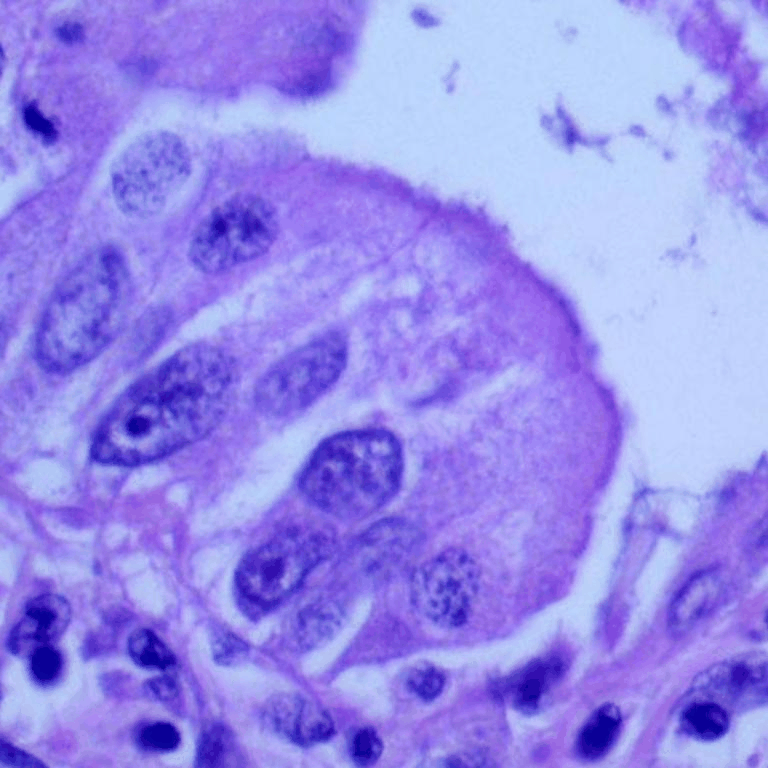

In [26]:
from IPython.display import Image, display

# adjust the path if yours lives elsewhere
gif_path = "/app/datasets/lung_colon_flat/augmentation.gif"
display(Image(filename=gif_path))